DO NOT USE---OLD

In [1]:
import collections
from etils import epath
from IPython.display import HTML
import matplotlib.pyplot as plt
from ml_collections import config_dict
import numpy as np
from scipy.io import wavfile
import tensorflow as tf
import tqdm


from chirp import audio_utils
from chirp import config_utils
from chirp import path_utils
from chirp.configs import config_globals
from chirp.inference import embed_lib
from chirp.inference import models
from chirp.inference import tf_examples
from chirp.models import metrics
from chirp.projects.bootstrap import bootstrap
from chirp.projects.bootstrap import search
from chirp.projects.bootstrap import display
from chirp.projects.multicluster import classify
from chirp.projects.multicluster import data_lib

2024-03-24 14:40:02.719640: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-24 14:40:02.719710: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-24 14:40:02.721482: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-24 14:40:02.730802: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-24 14:40:04.064428: W tensorflow/comp

In [2]:
# Model specific parameters: PLEASE DO NOT CHANGE THE CODE IN THIS CELL.
config = config_dict.ConfigDict()
embed_fn_config = config_dict.ConfigDict()
embed_fn_config.model_key = 'taxonomy_model_tf'
model_config = config_dict.ConfigDict()


model_config.window_size_s = 5.0

model_config.hop_size_s = 5.0

# All audio in this tutorial is resampled to 32 kHz.
model_config.sample_rate = 32000

# The location of the pre-trained model.
model_config.model_path = './bird-vocalization-classifier/'

# Only write embeddings to reduce size. The Perch codebase supports serializing
# a variety of metadata along with the embeddings, but for the purposes of this
# tutorial we will not need to make use of those features.
embed_fn_config.write_embeddings = True
embed_fn_config.write_logits = False
embed_fn_config.write_separated_audio = False
embed_fn_config.write_raw_audio = False

config.embed_fn_config = embed_fn_config
embed_fn_config.model_config = model_config

config.shard_len_s = -1
config.num_shards_per_file = -1

# Number of parent directories to include in the filename. This allows us to
# provess raw audio that lives in multiple directories.
config.embed_fn_config.file_id_depth = 1

# Number of TFRecord files to create.
config.tf_record_shards = 1

In [3]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU')]

In [4]:
unlabeled_audio_pattern = './ARU_data/1-CLEAR_mini/Data/*.wav'

# Specify a directory where the embeddings will be written.
embedding_output_dir = './raw_embeddings/'

config.output_dir = embedding_output_dir
config.source_file_patterns = [unlabeled_audio_pattern]

# Create output directory and write the configuration.
output_dir = epath.Path(config.output_dir)
output_dir.mkdir(exist_ok=True, parents=True)

# The path to an empty directory where the generated labeled samples will be
# placed. Each labeled sample will be placed into a subdirectory corresponding
# to the target class that we select for that sample.
labeled_data_path = './labeled_outputs/'

In [5]:
# This dumps a config json file next to the embeddings that allows us to reuse
# the same embeddings and ensure that we have the correct config that was used
# to generate them.
embed_lib.maybe_write_config(config, output_dir)

# Create SourceInfos configuration, used in sharded computation when computing
# embeddings.  These source_infos contain metadata about how we're going to
# partition the search corpus.  In particular, we're splitting the Powdermill
# audio into hundreds of 5s chunks, and the source_infos help us with the
# keep track of which chunk came from which raw audio file.
source_infos = embed_lib.create_source_infos(
    config.source_file_patterns,
    config.num_shards_per_file,
    config.shard_len_s)
print(f'Constructed {len(source_infos)} source infos.')

Constructed 760 source infos.


Loading the pre-trained model

In [6]:
# Here we're loading our generic Bird Classifier model.
# The embed_fn object is a wrapper over the model.
embed_fn = embed_lib.EmbedFn(**config.embed_fn_config)
print('\n\nLoading model(s)...')
embed_fn.setup()

print('\n\nTest-run of model...')
z = np.zeros([int(model_config.sample_rate * model_config.window_size_s)])
embed_fn.embedding_model.embed(z)
print('Setup complete!')



Loading model(s)...


2024-03-24 14:40:23.205735: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15517 MB memory:  -> device: 0, name: Quadro GP100, pci bus id: 0000:25:00.0, compute capability: 6.0
2024-03-24 14:40:23.206586: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 15517 MB memory:  -> device: 1, name: Quadro GP100, pci bus id: 0000:5b:00.0, compute capability: 6.0
2024-03-24 14:40:23.207220: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 15517 MB memory:  -> device: 2, name: Quadro GP100, pci bus id: 0000:9b:00.0, compute capability: 6.0




Test-run of model...


2024-03-24 14:40:28.173061: I external/local_xla/xla/service/service.cc:168] XLA service 0x1de85400 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-03-24 14:40:28.173116: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): Quadro GP100, Compute Capability 6.0
2024-03-24 14:40:28.173123: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (1): Quadro GP100, Compute Capability 6.0
2024-03-24 14:40:28.173127: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (2): Quadro GP100, Compute Capability 6.0
2024-03-24 14:40:28.570864: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-03-24 14:40:28.579195: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:38] Ignoring Assert operator jax2tf_infer_fn_/assert_equal_1/Assert/AssertGuard/Assert
2024-03-24 14:40:29.337465: I ext

Setup complete!


I0000 00:00:1711316434.140459 1043185 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Processing the search database

In [7]:
# To reduce the overhead computational resources required and speed up execution
# time, we use multiple threads to load the audio before embedding. This tends
# to perform faster, but can fail if any audio files are corrupt.

# The source_infos variable contains metadata about how to parition the search
# corpus.  This step creates an audio_iterator which iterates over the 5 second
# chunks of audio.
embed_fn.min_audio_s = 1.0
record_file = (output_dir / 'embeddings.tfrecord').as_posix()
succ, fail = 0, 0

audio_iterator = audio_utils.multi_load_audio_window(
    filepaths=[s.filepath for s in source_infos],
    offsets=[s.shard_num * s.shard_len_s for s in source_infos],
    sample_rate=model_config.sample_rate,
    window_size_s=config.shard_len_s,
)

Actually doing the embedding...

In [8]:
# This step may take a few minutes to run.

with tf_examples.EmbeddingsTFRecordMultiWriter(
    output_dir=output_dir, num_files=config.tf_record_shards) as file_writer:
  for source_info, audio in tqdm.tqdm(
      zip(source_infos, audio_iterator), total=len(source_infos)):
    if audio.shape[0] < embed_fn.min_audio_s * model_config.sample_rate:
      # Ignore short audio.
      continue
    file_id = source_info.file_id(config.embed_fn_config.file_id_depth)
    offset_s = source_info.shard_num * source_info.shard_len_s
    example = embed_fn.audio_to_example(file_id, offset_s, audio)
    if example is None:
      fail += 1
      continue
    file_writer.write(example.SerializeToString())
    succ += 1
  file_writer.flush()
print(f'\n\nSuccessfully processed {succ} source_infos, failed {fail} times.')

fns = [fn for fn in output_dir.glob('embeddings-*')]
ds = tf.data.TFRecordDataset(fns)
parser = tf_examples.get_example_parser()
ds = ds.map(parser)
for ex in ds.as_numpy_iterator():
  print('Recording filename:', ex['filename'])
  print('Shape of the embedding:', ex['embedding'].shape)
  break

  0%|                                                     | 0/760 [00:00<?, ?it/s]2024-03-24 14:40:55.298124: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:38] Ignoring Assert operator jax2tf_infer_fn_/assert_equal_1/Assert/AssertGuard/Assert
2024-03-24 14:40:57.793329: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[179,640,501,1]{3,2,1,0}, u8[0]{0}) custom-call(f32[179,1,160640,1]{3,2,1,0}, f32[640,1,640,1]{3,2,1,0}), window={size=640x1 stride=320x1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-03-24 14:40:58.772842: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.979607817s
Trying algorithm eng0{} for conv (f32[179,640,501,1]{3,2,1,0}, u8[0]{0}) custom-call(f32[179,1,160640,1]{3,2,1,0}, f32[640,1,640,1]{3,2,1,0}), window={size=640x1 stride

KeyboardInterrupt: 

Now that we've made the embeddings, we can define the "target classes." These are what the output nodes from the small model will represent. 

In [9]:
target_classes = ["Western Tanager", "Golden-crowned Kinglet", "Unknown"]

In [43]:
audio_path = './target_recordings/gcki_song.mp3'
audio = audio_utils.load_audio(audio_path, model_config.sample_rate)

display.plot_audio_melspec(audio, model_config.sample_rate)

2024-03-24 14:51:55.090058: W external/tsl/tsl/framework/bfc_allocator.cc:482] Allocator (GPU_0_bfc) ran out of memory trying to allocate 14.87MiB (rounded to 15593472)requested by op 
2024-03-24 14:51:55.090181: W external/tsl/tsl/framework/bfc_allocator.cc:494] ********************************************************xxx*****************************xxxxxxxxxxx_
E0324 14:51:55.090250 1043185 pjrt_stream_executor_client.cc:2804] Execution of replica 0 failed: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 15593472 bytes.
BufferAssignment OOM Debugging.
BufferAssignment stats:
             parameter allocation:   14.87MiB
              constant allocation:         0B
        maybe_live_out allocation:   14.87MiB
     preallocated temp allocation:         0B
                 total allocation:   29.74MiB
              total fragmentation:         0B (0.00%)
Peak buffers:
	Buffer 1:
		Size: 14.87MiB
		Entry Parameter Subshape: f32[1,3898368]

	Buffer 2:
		Size: 14.87MiB
		XLA La

ValueError: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 15593472 bytes.
BufferAssignment OOM Debugging.
BufferAssignment stats:
             parameter allocation:   14.87MiB
              constant allocation:         0B
        maybe_live_out allocation:   14.87MiB
     preallocated temp allocation:         0B
                 total allocation:   29.74MiB
              total fragmentation:         0B (0.00%)
Peak buffers:
	Buffer 1:
		Size: 14.87MiB
		Entry Parameter Subshape: f32[1,3898368]
		==========================

	Buffer 2:
		Size: 14.87MiB
		XLA Label: fusion
		Shape: f32[1,3898368]
		==========================



Selected audio window:


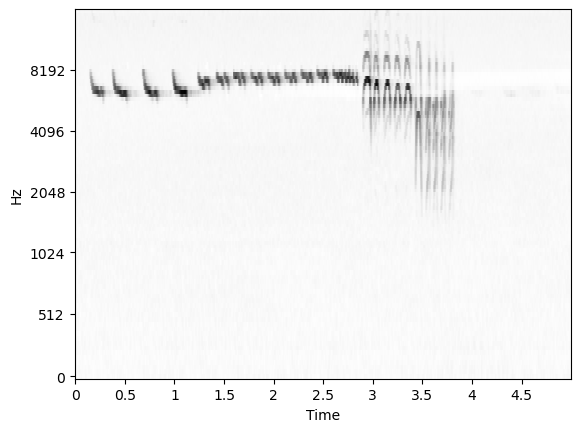

In [27]:
start_s = 2

print('Selected audio window:')
st = int(start_s * model_config.sample_rate)
end = int(st + model_config.window_size_s * model_config.sample_rate)
if end > audio.shape[0]:
  end = audio.shape[0]
  st = max([0, int(end - model_config.window_size_s * model_config.sample_rate)])
audio_window = audio[st:end]
display.plot_audio_melspec(audio_window, model_config.sample_rate)

query_audio = audio_window
sep_outputs = None

In [28]:
query = query_audio

embedded_query = embed_fn.embedding_model.embed(query).embeddings[ :, 0, :]

In [1]:
# Use the embedded dataset that we created above...
embeddings_dir = embedding_output_dir

bootstrap_config = bootstrap.BootstrapConfig.load_from_embedding_config(
    embeddings_path=embeddings_dir,
    annotated_path=labeled_data_path
)

project_state = bootstrap.BootstrapState(
    bootstrap_config, embedding_model=embed_fn.embedding_model)

embeddings_ds = project_state.create_embeddings_dataset()

NameError: name 'embedding_output_dir' is not defined

In [56]:
# Number of search results to capture.
top_k = 10 # @param {type:"number"}

# The Perch codebase supports:
#  'euclidean', which is the standard euclidean distance
#  'cosine', which is the cosine similarity,
#  'mip', which is Maximum Inner Product
metric = 'euclidean'  #@param['euclidean', 'mip', 'cosine']

# Target distance for search results.
# This lets us try to hone in on a 'classifier boundary' instead of just
# looking at the closest matches.
# Set to 'None' for raw 'best results' search.
target_score = None #@param

results, all_scores = search.search_embeddings_parallel(
    embeddings_ds, embedded_query,
    hop_size_s=model_config.hop_size_s,
    top_k=top_k, target_score=target_score, score_fn=metric,
    random_sample=False)

542it [00:00, 1125.52it/s]


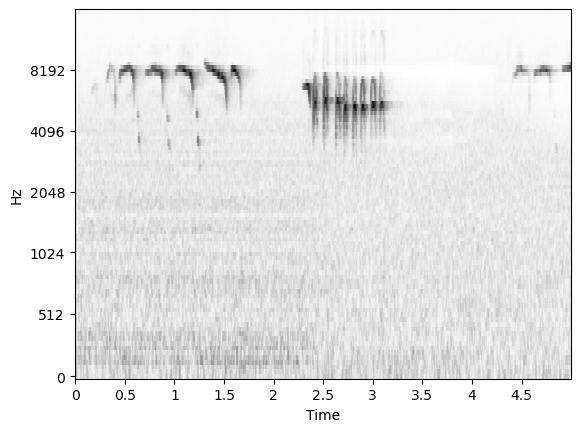

rank        : 0
source file : Data/1-CLEAR_20230607_080000.wav
offset_s    : 455.00
score       : 3.21


Button(description='Western Tanager', style=ButtonStyle())

Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


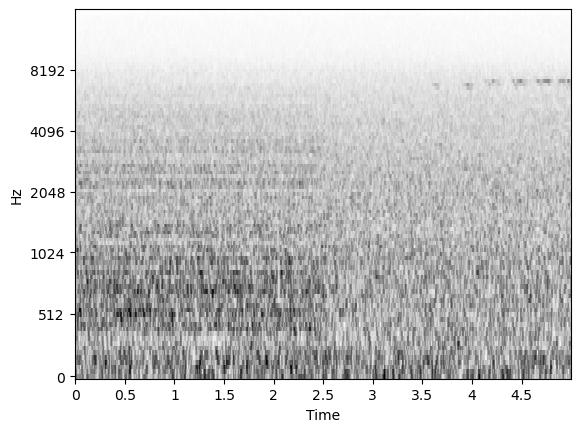

rank        : 1
source file : Data/1-CLEAR_20230529_073000.wav
offset_s    : 585.00
score       : 3.30


Button(description='Western Tanager', style=ButtonStyle())

Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


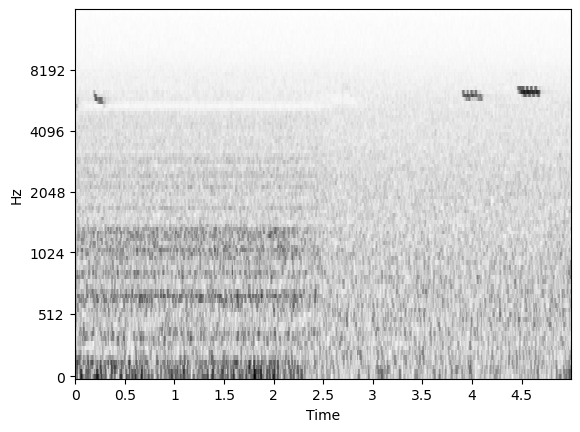

rank        : 2
source file : Data/1-CLEAR_20230601_053000.wav
offset_s    : 460.00
score       : 3.33


Button(description='Western Tanager', style=ButtonStyle())

Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


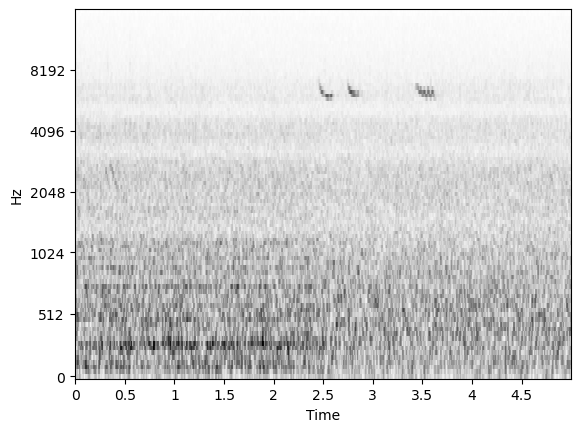

rank        : 3
source file : Data/1-CLEAR_20230616_050000.wav
offset_s    : 595.00
score       : 3.35


Button(description='Western Tanager', style=ButtonStyle())

Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


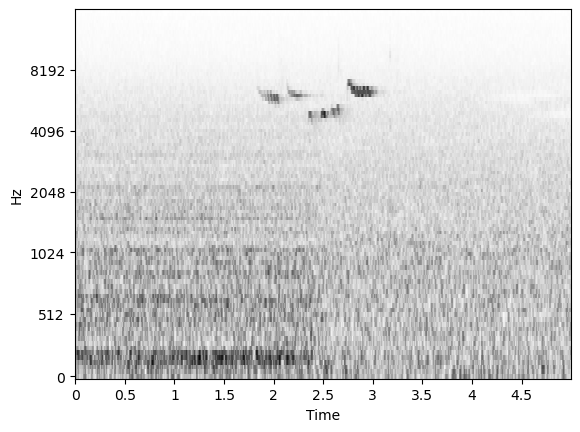

rank        : 4
source file : Data/1-CLEAR_20230605_080000.wav
offset_s    : 575.00
score       : 3.36


Button(description='Western Tanager', style=ButtonStyle())

Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


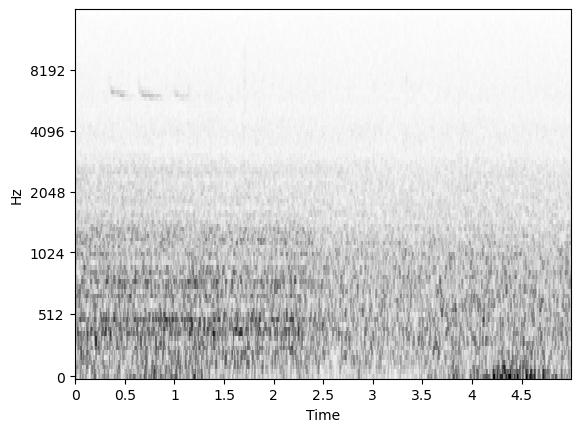

rank        : 5
source file : Data/1-CLEAR_20230619_163000.wav
offset_s    : 150.00
score       : 3.36


Button(description='Western Tanager', style=ButtonStyle())

Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


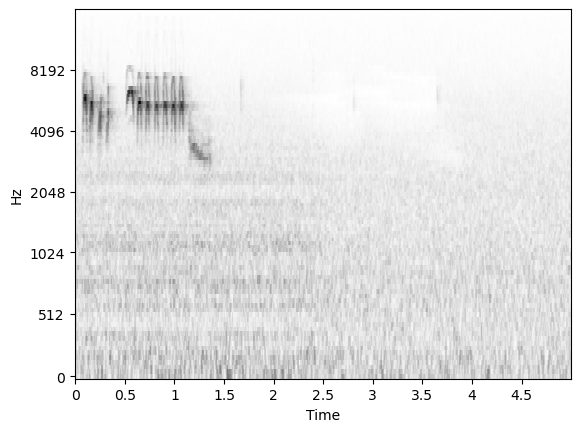

rank        : 6
source file : Data/1-CLEAR_20230604_090000.wav
offset_s    : 650.00
score       : 3.37


Button(description='Western Tanager', style=ButtonStyle())

Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


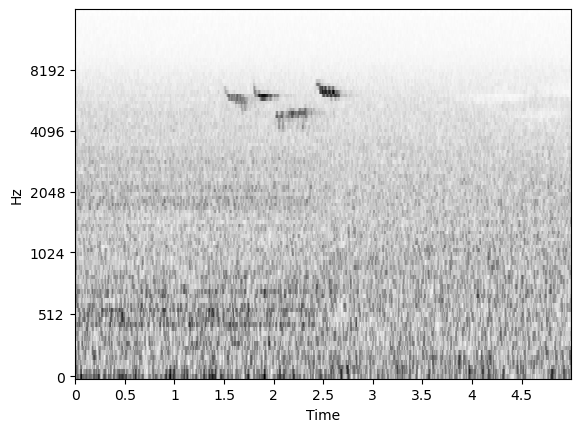

rank        : 7
source file : Data/1-CLEAR_20230606_063000.wav
offset_s    : 645.00
score       : 3.38


Button(description='Western Tanager', style=ButtonStyle())

Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


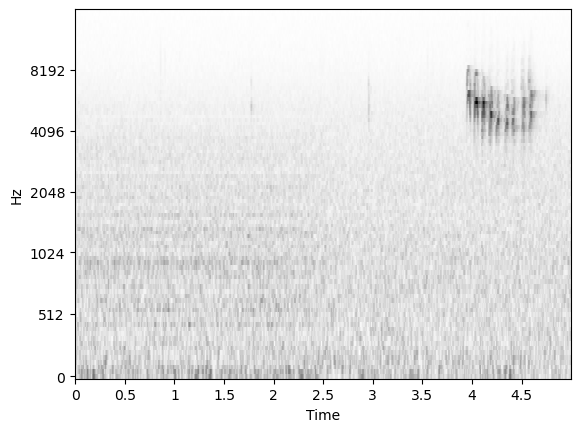

rank        : 8
source file : Data/1-CLEAR_20230604_090000.wav
offset_s    : 660.00
score       : 3.38


Button(description='Western Tanager', style=ButtonStyle())

Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


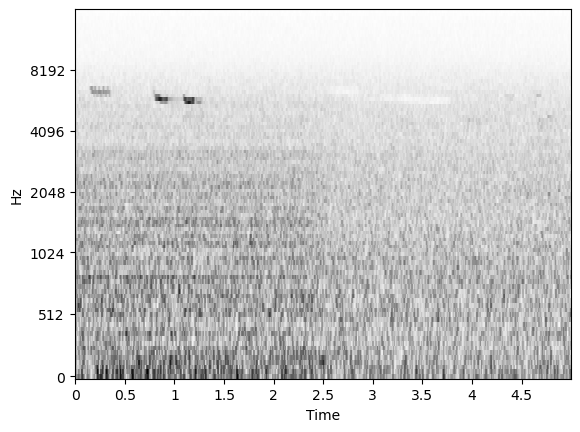

rank        : 9
source file : Data/1-CLEAR_20230601_053000.wav
offset_s    : 170.00
score       : 3.38


Button(description='Western Tanager', style=ButtonStyle())

Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


In [57]:
# Display the search results for user labeling.
display.display_search_results(
    results, model_config.sample_rate, project_state.source_map,
    checkbox_labels=target_classes,
    max_workers=5)

In [37]:
def write_labeled_data(search_results, labeled_data_path: str, sample_rate: int):
  """Write labeled results to the labeled data collection."""
  labeled_data_path = epath.Path(labeled_data_path)
  counts = collections.defaultdict(int)
  duplicates = collections.defaultdict(int)
  for r in search_results:
    labels = [ch.description for ch in r.label_widgets if ch.value]
    if not labels:
      continue
    extension = epath.Path(r.filename).suffix
    filename = epath.Path(r.filename).name[: -len(extension)]
    output_filename = f'{filename}___{r.timestamp_offset}{extension}'
    for label in labels:
      output_path = labeled_data_path / label
      output_path.mkdir(parents=True, exist_ok=True)
      output_filepath = epath.Path(output_path / output_filename)
      if output_filepath.exists():
        duplicates[f'{label}'] += 1
        continue
      else:
        counts[label] += 1
      with output_filepath.open('wb') as f:
        wavfile.write(f, sample_rate, np.float32(r.audio))
  for label, count in counts.items():
    print(f'Wrote {count} examples for label {label}')
  for label, count in duplicates.items():
    print(f'Not saving {count} duplicates for label {label}')

write_labeled_data(results, labeled_data_path, model_config.sample_rate)

Wrote 3 examples for label Golden-crowned Kinglet
Not saving 2 duplicates for label Golden-crowned Kinglet
Not saving 5 duplicates for label Unknown


In [21]:
# @title Load and embed the search-annotated dataset { vertical-output: true }

# Load the training data that is located in the `labeled_data_path` directory.
# In that directory there will be folders corresponding to our target labels

merged = data_lib.MergedDataset.from_folder_of_folders(
    base_dir=labeled_data_path,
    embedding_model=project_state.embedding_model,
    time_pooling='mean',
    load_audio=False,
    target_sample_rate=-2,
    audio_file_pattern='*',
    embedding_config_hash=bootstrap_config.embedding_config_hash(),
)

# Label distribution
lbl_counts = np.sum(merged.data['label_hot'], axis=0)
print('num classes :', (lbl_counts > 0).sum())
print('mean ex / class :', lbl_counts.sum() / (lbl_counts > 0).sum())
print('min ex / class :', (lbl_counts + (lbl_counts == 0) * 1e6).min())

Embedding from Folder of Folders...
Checking for existing embeddings from Folder of Folders...
    found 3 classes.
    class Golden-crowned Kinglet / 0 : 10
    class Other / 1 : 9
Found 19 existing embeddings.
Checking for new sources to embed from Folder of Folders...


0it [00:00, ?it/s]
0it [00:00, ?it/s]
100%|█████████████████████████████████████████████| 10/10 [00:00<00:00, 72.76it/s]


...embedded dataset in  0.50s...
    found 3 classes.
    class Western Tanager / 2 : 10
num classes : 3
mean ex / class : 9.666666666666666
min ex / class : 9.0


Simple Linear Model

In [38]:
# Number of random training examples to choose from each class.

# Note that if you don't have very many samples you'll need to set
# train_ratio=None and train_examples_per_class to a value that is
# less than the minimum number of examples you have of each class.

# Set exactly one of train_ratio and train_examples_per_class
train_ratio = None  #@param
train_examples_per_class = 5  #@param

# Number of random re-trainings. In other words, this value indicates how many
# models we will train.  By training multiple models, we get a sense of model
# robustness.  Training a single model (ie, num_seeds = 1) is sufficient for
# this tutorial, but feel free to bump this up to 4 or 12 to see the different
# characteristics of how the models perform.
num_seeds = 1  #@param

# Classifier training hyperparams.
# These should be good defaults.
batch_size = 12
num_epochs = 128
num_hiddens = -1
learning_rate = 1e-3

In [39]:
# This cell trains the linear model(s) and output some summary statistics for
# each model.  If you only have num_seeds = 1 then we'll only train a single
# model here.
metrics = collections.defaultdict(list)
for seed in tqdm.tqdm(range(num_seeds)):
  if num_hiddens > 0:
    model = classify.get_two_layer_model(
        num_hiddens, merged.embedding_dim, merged.num_classes)
  else:
    model = classify.get_linear_model(
        merged.embedding_dim, merged.num_classes)
  run_metrics = classify.train_embedding_model(
      model, merged, train_ratio, train_examples_per_class,
      num_epochs, seed, batch_size, learning_rate)
  metrics['acc'].append(run_metrics.top1_accuracy)
  metrics['auc_roc'].append(run_metrics.auc_roc)
  metrics['cmap'].append(run_metrics.cmap_value)
  metrics['maps'].append(run_metrics.class_maps)
  metrics['test_logits'].append(run_metrics.test_logits)

100%|███████████████████████████████████████████████| 1/1 [00:25<00:00, 25.49s/it]


In [30]:
mean_acc = np.mean(metrics['acc'])
mean_auc = np.mean(metrics['auc_roc'])
mean_cmap = np.mean(metrics['cmap'])
# Merge the test_logits into a single array.
test_logits = {
    k: np.concatenate([logits[k] for logits in metrics['test_logits']])
    for k in metrics['test_logits'][0].keys()
}

print(f'acc:{mean_acc:5.2f}, auc_roc:{mean_auc:5.2f}, cmap:{mean_cmap:5.2f}')
for lbl, auc in zip(merged.labels, run_metrics.class_maps):
  if np.isnan(auc):
    continue
  print(f'\n{lbl:8s}, auc_roc:{auc:5.2f}')

acc: 0.89, auc_roc: 1.00, cmap: 1.00

Golden-crowned Kinglet, auc_roc: 1.00

Other   , auc_roc: 1.00


Generating new samples using logit scores

In [51]:
# Choose the target class to work with.  This must be one of the values from the
# target_classes list above.
target_class = 'Golden-crowned Kinglet'  
# Choose a target logit; will display results close to the target.
# Set to None to get the highest-logit examples.
target_logit = None  #@param
# Number of results to display.
num_results = 10  #@param

# Create the embeddings dataset.
target_class_idx = merged.labels.index(target_class)
results, all_logits = search.classifer_search_embeddings_parallel(
    embeddings_classifier=model,
    target_index=target_class_idx,
    embeddings_dataset=embeddings_ds,
    hop_size_s=model_config.hop_size_s,
    target_score=target_logit,
    top_k=num_results
)

542it [00:00, 1012.70it/s]


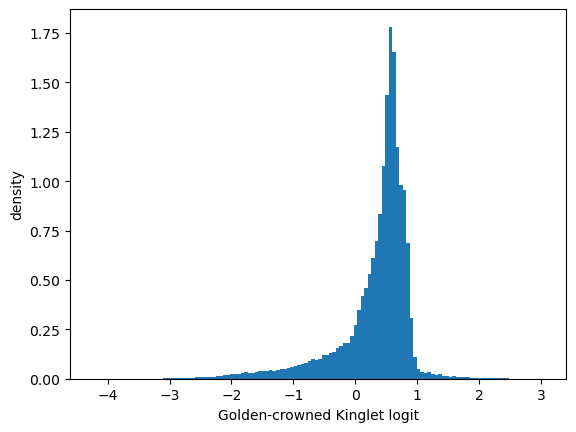

In [52]:
# Plot the histogram of model logits.
_, ys, _ = plt.hist(all_logits, bins=128, density=True)
plt.xlabel(f'{target_class} logit')
plt.ylabel('density')
# plt.yscale('log')
plt.plot([target_logit, target_logit], [0.0, np.max(ys)], 'r:')
plt.show()

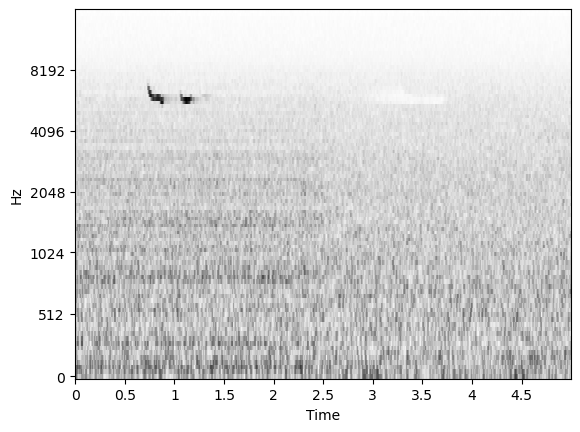

rank        : 0
source file : Data/1-CLEAR_20230601_053000.wav
offset_s    : 520.00
score       : 3.04


Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Other', style=ButtonStyle())

Button(description='Western Tanager', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


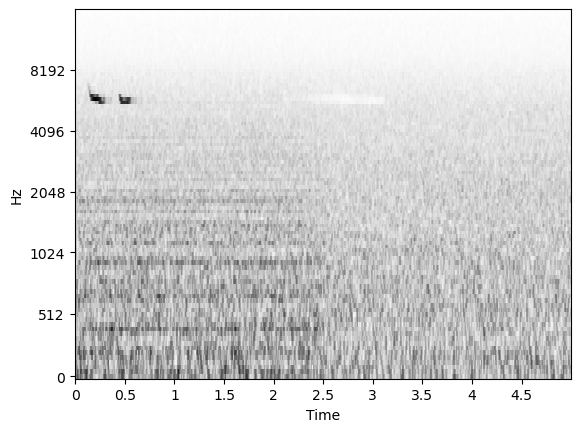

rank        : 1
source file : Data/1-CLEAR_20230601_053000.wav
offset_s    : 535.00
score       : 2.89


Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Other', style=ButtonStyle())

Button(description='Western Tanager', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


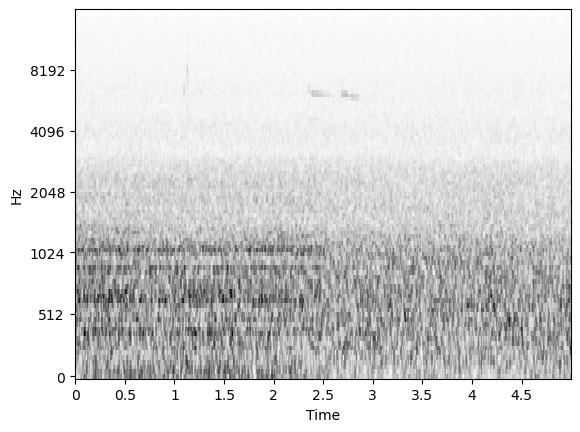

rank        : 2
source file : Data/1-CLEAR_20230619_163000.wav
offset_s    : 175.00
score       : 2.81


Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Other', style=ButtonStyle())

Button(description='Western Tanager', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


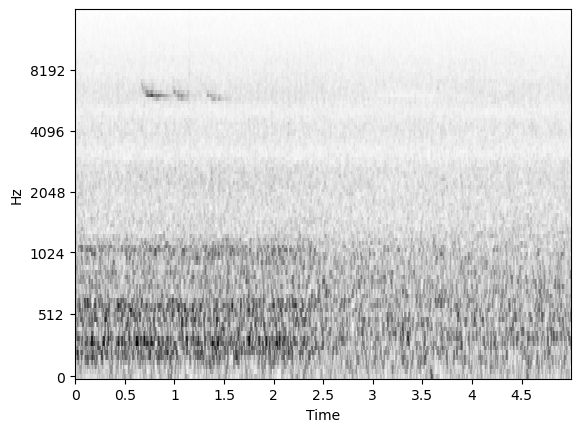

rank        : 3
source file : Data/1-CLEAR_20230619_073000.wav
offset_s    : 385.00
score       : 2.77


Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Other', style=ButtonStyle())

Button(description='Western Tanager', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


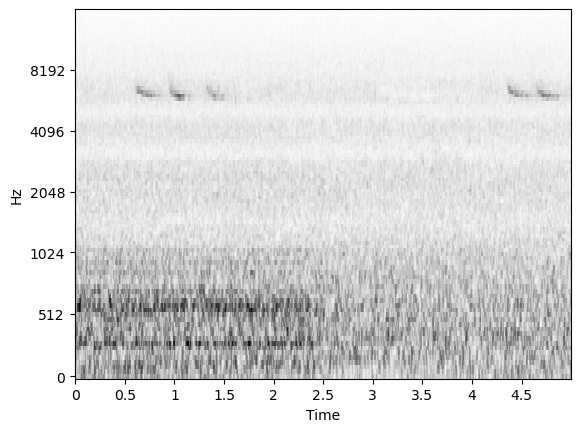

rank        : 4
source file : Data/1-CLEAR_20230619_073000.wav
offset_s    : 540.00
score       : 2.76


Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Other', style=ButtonStyle())

Button(description='Western Tanager', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


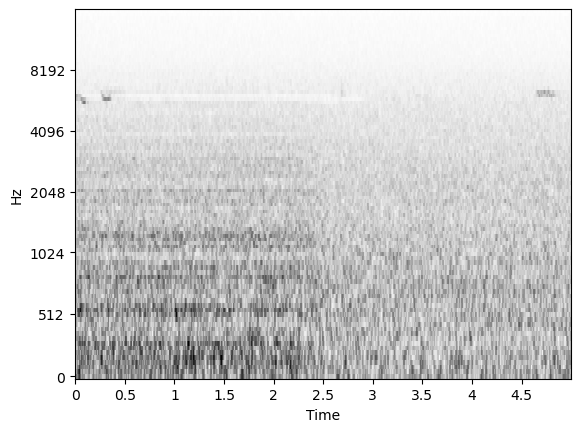

rank        : 5
source file : Data/1-CLEAR_20230602_053000.wav
offset_s    : 720.00
score       : 2.73


Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Other', style=ButtonStyle())

Button(description='Western Tanager', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


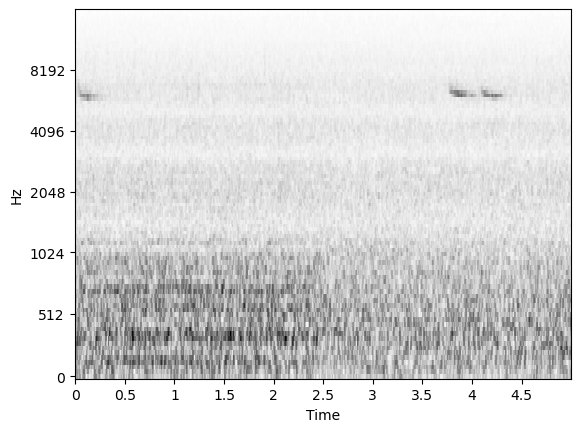

rank        : 6
source file : Data/1-CLEAR_20230619_073000.wav
offset_s    : 455.00
score       : 2.73


Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Other', style=ButtonStyle())

Button(description='Western Tanager', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


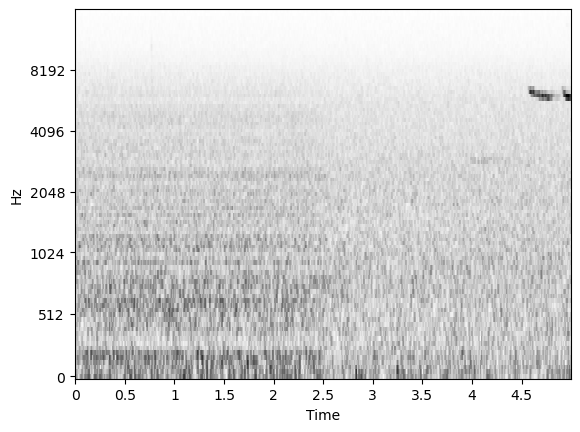

rank        : 7
source file : Data/1-CLEAR_20230528_163000.wav
offset_s    : 75.00
score       : 2.72


Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Other', style=ButtonStyle())

Button(description='Western Tanager', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


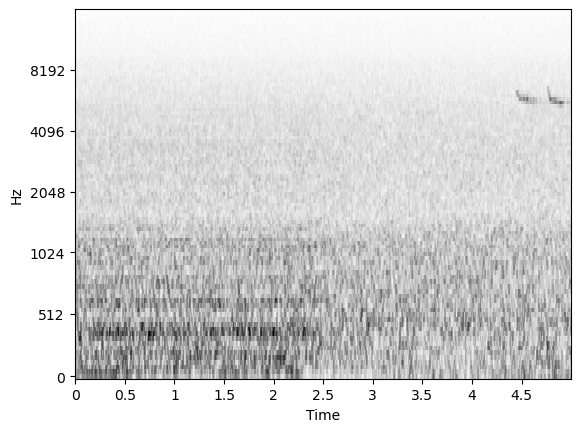

rank        : 8
source file : Data/1-CLEAR_20230608_100000.wav
offset_s    : 615.00
score       : 2.71


Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Other', style=ButtonStyle())

Button(description='Western Tanager', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


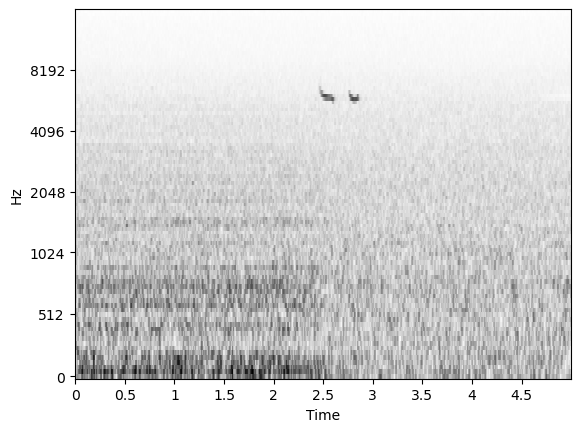

rank        : 9
source file : Data/1-CLEAR_20230602_053000.wav
offset_s    : 615.00
score       : 2.70


Button(description='Golden-crowned Kinglet', style=ButtonStyle())

Button(description='Other', style=ButtonStyle())

Button(description='Western Tanager', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


In [55]:
#@title Display results for the target label { vertical-output: true }

display_labels = merged.labels

extra_labels = []  #@param
for label in extra_labels:
  if label not in merged.labels:
    display_labels += (label,)
if 'Unknown' not in merged.labels:
  display_labels += ('Unknown',)

display.display_search_results(
    results, model_config.sample_rate,
    project_state.source_map,
    checkbox_labels=display_labels,
    max_workers=5)

In [54]:
results.write_labeled_data(labeled_data_path, model_config.sample_rate)

Wrote 9 examples for label Unknown
Wrote 1 examples for label Golden-crowned Kinglet
